In [23]:
from datetime import datetime
from pytz import timezone
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import seaborn as sns

import csv
from statistics import mean 
import pandas as pd
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
from support_functions import lag_correlation
#from sklearn.ensemble import RandomForestRegresso

In [24]:

def lag_correlation(y1, y2):
    import matplotlib.pyplot as plt
    from scipy.stats import spearmanr, pearsonr
    
    npts = len(y1)
    lags = np.arange(-npts + 1, npts)
    ccov = np.correlate(y2 - y2.mean(), y1 - y1.mean(), mode='full')
    ccor = ccov / (npts * y2.std() * y1.std())
    fig= plt.figure(figsize=(15,5))
    plt.plot(lags, ccor)
    plt.ylabel('cross-correlation',fontsize =18)
    plt.xlabel('lag of y2 relative to y1', fontsize = 18)
    
    maxlag = lags[np.argmax(ccor)]
    print("max correlation is at lag %d" % maxlag)
    maxcorr = round(max(ccor),3)
    print("max correlation is ", round(max(ccor),3))
    corr, _ = pearsonr(y2, y1) 
    print('Pearsons correlation: %.3f' % corr) 
    MSE = mean_squared_error(y1, y2)
    MAE = mean_absolute_error(y1, y2)
    RMSE = np.sqrt(MSE)
    print("MSE : ", MSE)
    print("MAE : ", MAE)
    print("RMSE : ", RMSE)
    return

# CO

In [2]:
a = pd.read_csv('Aeroqual_data//aeroqual_120222_co.csv', parse_dates = ['Date Time'])

c = pd.read_csv('CO_8sensors_12feb.csv', parse_dates = ['Date Time'])

In [3]:
a = a.drop(columns = {'Monitor ID', 'Location ID'})
c.set_index("Date Time", inplace = True)
c = c.resample('T', label='right', closed='right').mean().round(3)
c = c.reset_index()

In [4]:
# merging CO and Aeroqual data
O = a.merge(c, on = 'Date Time', how = 'inner')

In [5]:
O['CO_8'] = O['CO_8'].abs()

In [6]:
def despike(yi, th=1.e-8):
    '''Remove spike from array yi, the spike area is where the difference between 
    the neigboring points is higher than th.'''
    y = np.copy(yi) # use y = y1 if it is OK to modify input array
    n = len(y)
    x = np.arange(n)
    c = np.argmax(y)
    d = abs(np.diff(y))
    try:
        l = c - 1 - np.where(d[c-1::-1]<th)[0][0]
        r = c + np.where(d[c:]<th)[0][0] + 1
    except: # no spike, return unaltered array
        return y
    # for fit, use area twice wider then the spike
    if (r-l) <= 3:
        l -= 1
        r += 1
    s = int(round((r-l)/2.))
    lx = l - s
    rx = r + s
    # make a gap at spike area
    xgapped = np.concatenate((x[lx:l],x[r:rx]))
    ygapped = np.concatenate((y[lx:l],y[r:rx]))
    # quadratic fit of the gapped array
    z = np.polyfit(xgapped,ygapped,2)
    p = np.poly1d(z)
    y[l:r] = p(x[l:r])
    return y


In [7]:
#O['CO_5_NEW']= despike(O['CO_5'], th= 5)
x=O['CO_5']   
O['CO_5 '] = x[x.between(x.quantile(.000), x.quantile(0.98))]

In [15]:
fig = px.line(O, x='Date Time', y=O.columns)
fig.show()
import plotly.io as pio
pio.write_image(fig,'test.pdf', format='pdf')


In [79]:
pip install -U kaleido

     |████████████████████████████████| 79.9 MB 109 kB/s eta 0:00:01     |██████████▋                     | 26.6 MB 426 kB/s eta 0:02:05
Note: you may need to restart the kernel to use updated packages.


In [22]:
O1 = O.dropna()
o1 = O1.drop(columns = { 'temperature','humidity','CO_1','CO_2','CO_3','CO_4','CO_5','CO_6','CO_7','CO_8','CO_5 '})

In [75]:
fig = px.line(O1, x='Date Time', y=O1.columns)
fig.show()
fig.write_image("figure.pdf", engine="kaleido")


ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['CO', 'temperature', 'humidity', 'CO_1', 'CO_2', 'CO_3', 'CO_4', 'CO_5', 'CO_6', 'CO_7', 'CO_8'] but received: Date Time

In [20]:
list(O)

['Date Time',
 'CO(ppm)',
 'temperature',
 'humidity',
 'CO_1',
 'CO_2',
 'CO_3',
 'CO_4',
 'CO_5',
 'CO_6',
 'CO_7',
 'CO_8',
 'CO_5 ',
 'Rolling_CO_8',
 'Rolling_CO_3',
 'Rolling_CO_5']

Text(0.5, 1.0, 'correlation of data')

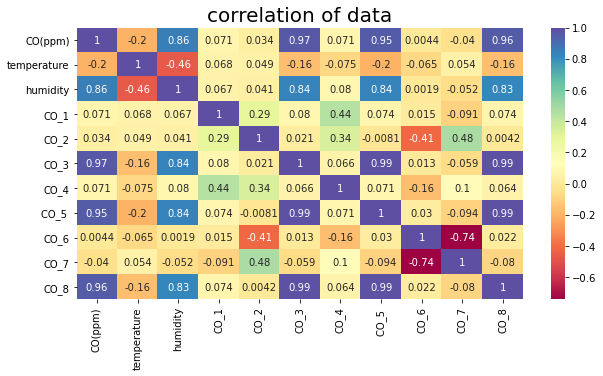

In [15]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(O[['CO(ppm)',
 'temperature',
 'humidity',
 'CO_1',
 'CO_2',
 'CO_3',
 'CO_4',
 'CO_5 ',
 'CO_6',
 'CO_7',
 'CO_8',
 ]].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

Text(0.5, 1.0, 'correlation of data')

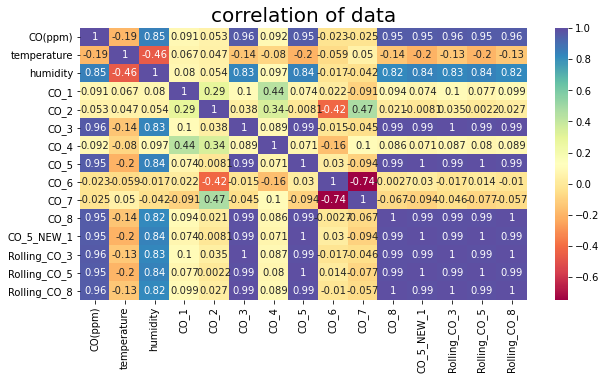

In [20]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(O1[['CO(ppm)',
 'temperature',
 'humidity',
 'CO_1',
 'CO_2',
 'CO_3',
 'CO_4',
 'CO_5',
 'CO_6',
 'CO_7',
 'CO_8',
 'CO_5_NEW_1', 'Rolling_CO_3', 'Rolling_CO_5',  'Rolling_CO_8']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

In [21]:
print(len(O))
print(len(O1))

483
455


In [19]:
rolling_windows = O['CO_5'].rolling(2, min_periods=1)

O['Rolling_CO_5'] = rolling_windows.mean()

max correlation is at lag 7
max correlation is  0.967
Pearsons correlation: 0.962
MSE :  140.5004949593406
MAE :  11.148690109890106
RMSE :  11.853290469710958
max correlation is at lag 7
max correlation is  0.944
Pearsons correlation: 0.935
MSE :  114.8957848395602
MAE :  10.494103296703285
RMSE :  10.718945136512277
max correlation is at lag 7
max correlation is  0.967
Pearsons correlation: 0.956
MSE :  141.47857815109893
MAE :  11.418847252747254
RMSE :  11.89447679181808


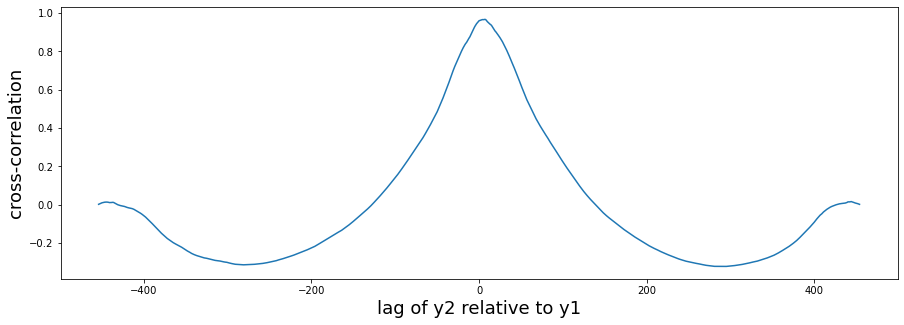

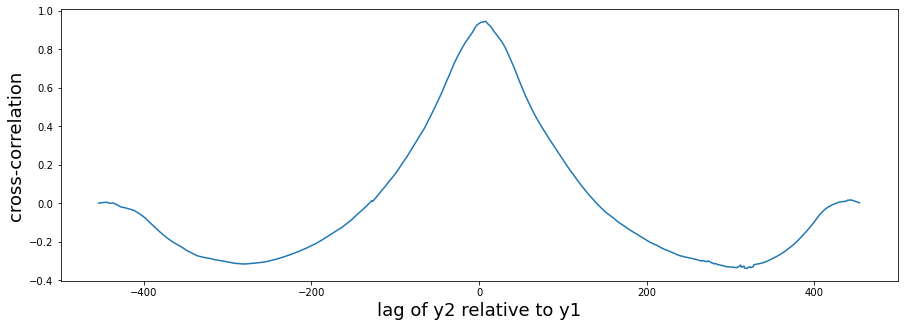

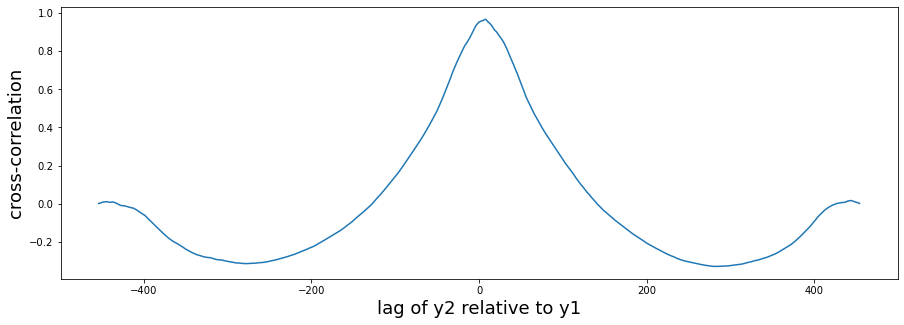

In [27]:
y1 = o1['CO(ppm)']
y2 = o1['Rolling_CO_3']
y3 = o1['Rolling_CO_5']
y4 = o1['Rolling_CO_8']

lag_correlation(y1, y2)
lag_correlation(y1, y3)
lag_correlation(y1, y4)


In [28]:
O1['Rolling_CO_3_shift'] = O1['Rolling_CO_3'].shift(-7)
O1['Rolling_CO_5_shift'] = O1['Rolling_CO_5'].shift(-7)
O1['Rolling_CO_8_shift'] = O1['Rolling_CO_8'].shift(-7)


<ipython-input-28-c650864123c1>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-28-c650864123c1>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-28-c650864123c1>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [29]:
O2 = O1.dropna()

max correlation is at lag 0
max correlation is  0.979
Pearsons correlation: 0.981
MSE :  141.1520061897321
MAE :  11.202167410714281
RMSE :  11.880740978143244
max correlation is at lag 0
max correlation is  0.951
Pearsons correlation: 0.953
MSE :  114.29689977901761
MAE :  10.477399553571416
RMSE :  10.69097281724248
max correlation is at lag 0
max correlation is  0.977
Pearsons correlation: 0.979
MSE :  141.55633063783483
MAE :  11.444047991071429
RMSE :  11.897744771083083


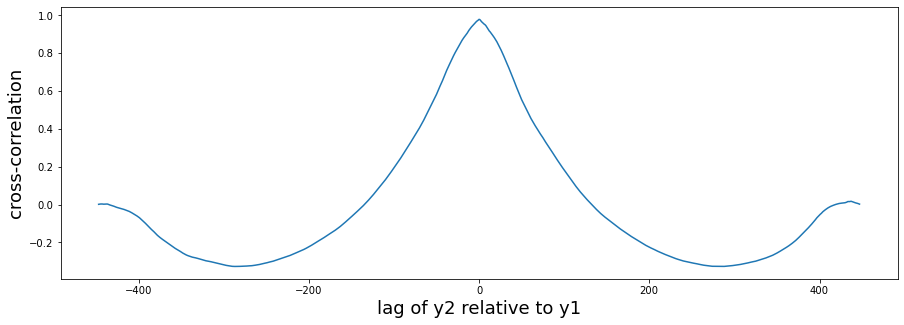

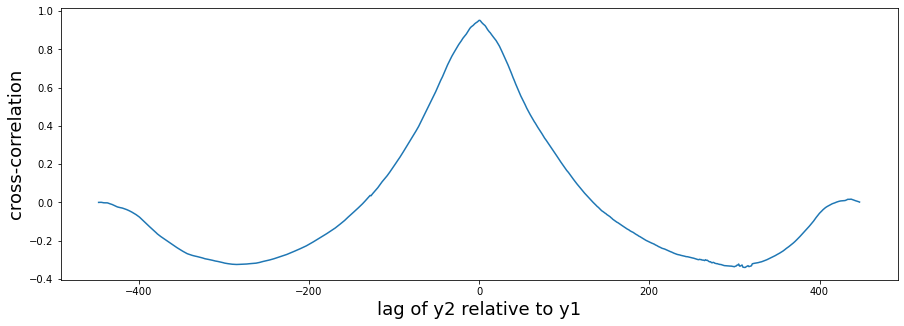

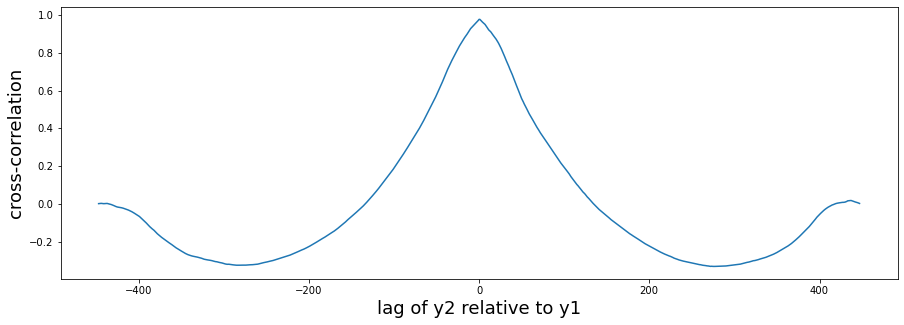

In [30]:
y1 = O2['CO(ppm)']
y2 = O2['Rolling_CO_3_shift']
y3 = O2['Rolling_CO_5_shift']
y4 = O2['Rolling_CO_8_shift']

lag_correlation(y1, y2)
lag_correlation(y1, y3)
lag_correlation(y1, y4)


In [31]:
list(O2)

['Date Time',
 'CO(ppm)',
 'temperature',
 'humidity',
 'CO_1',
 'CO_2',
 'CO_3',
 'CO_4',
 'CO_5',
 'CO_6',
 'CO_7',
 'CO_8',
 'CO_5 ',
 'Rolling_CO_8',
 'Rolling_CO_3',
 'Rolling_CO_5',
 'Rolling_CO_3_shift',
 'Rolling_CO_5_shift',
 'Rolling_CO_8_shift']

Text(0.5, 1.0, 'correlation of data')

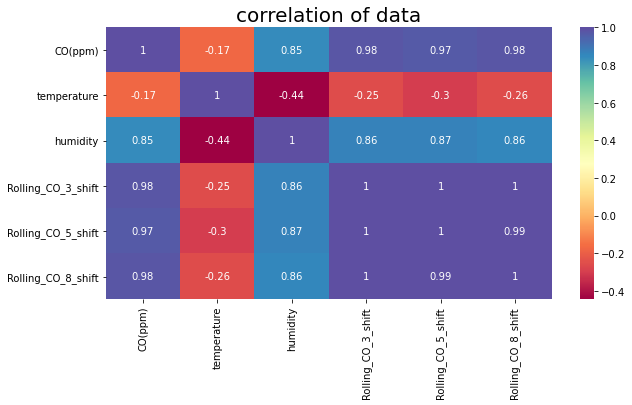

In [43]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(O2[['CO(ppm)',
 'temperature',
 'humidity',
 'Rolling_CO_3_shift',
 'Rolling_CO_5_shift',
 'Rolling_CO_8_shift']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

Coefficients:  [0.37558285]
Intercept:  -2.770380864920918
R2  0.9389278625717233
MAE of simple linear regression of  0.361723902251053
MSE of simple linear regression 0.4054857116436426
RMSE of simple linear regression 0.6367775998287335
Test data Pearson correlation Random Forest: 0.969
Test data Spearman correlation of simple linear regression: 0.897


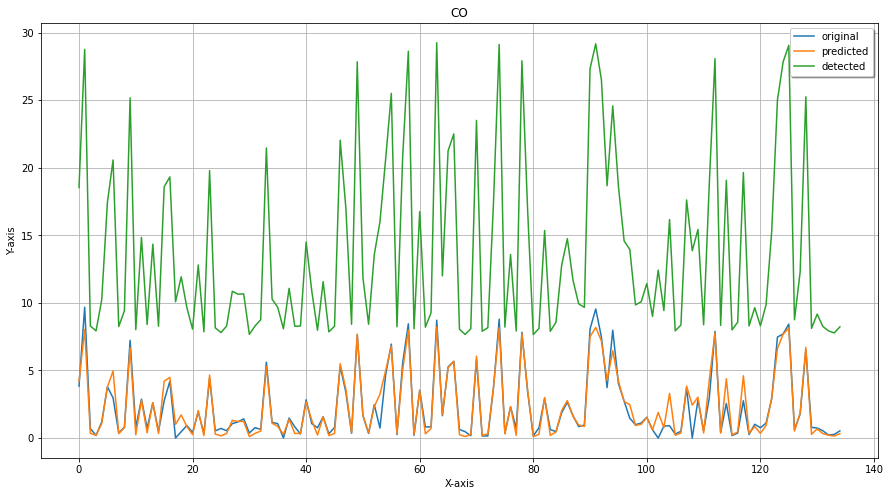

In [32]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2['Rolling_CO_3_shift']
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Polynomial linear regression MAE: 0.3229823818372383
Polynomial linear regression MSE: 0.3263233685561167
Polynomial linear regression RMSE: 0.5712472044186446
Polynomial linear regression R-2 score: 0.951
Polynomial linear regression Spearman correlation: 0.897
Polynomial linear regression Pearson correlation: 0.975


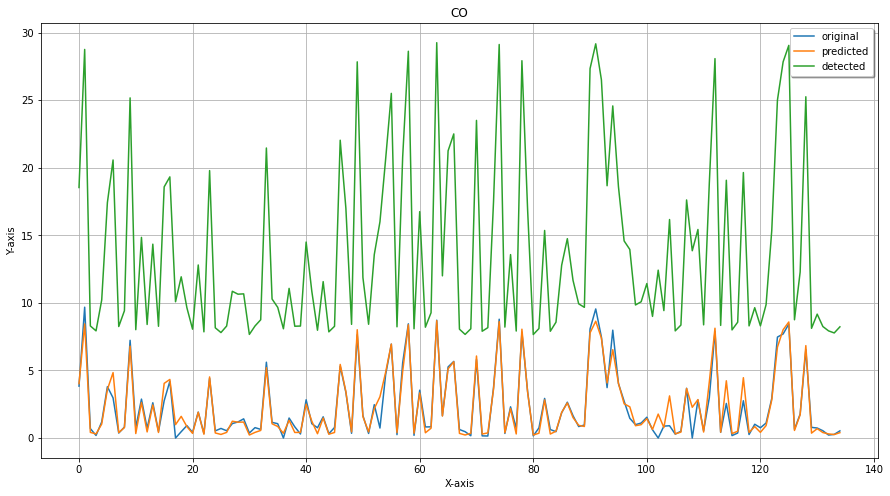

In [115]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,1))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,1)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Polynomial linear regression Pearson correlation: {pearson[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax,pred_y, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Coefficients:  [0.37878119 0.60005105]
Intercept:  -19.61008558463247
R2  0.9503124003851617
MAE of simple linear regression of  0.3515504697282734
MSE of simple linear regression 0.3298985844952379
RMSE of simple linear regression 0.5743679870041835
Test data Pearson correlation Random Forest: 0.975
Test data Spearman correlation of simple linear regression: 0.895


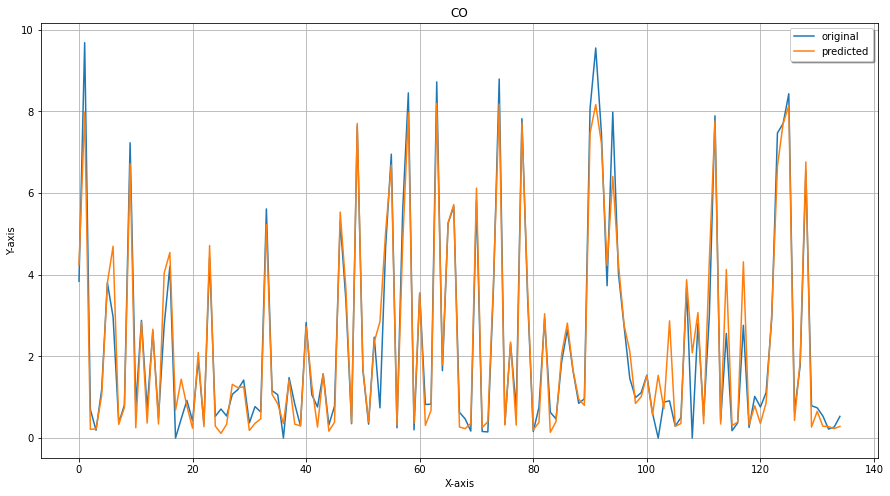

In [101]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_3_shift', 'temperature']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



In [103]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,2))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,2)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Polynomial linear regression Pearson correlation: {pearson[0]:.3}')



Polynomial linear regression MAE: 0.25163799200634973
Polynomial linear regression MSE: 0.16827628271339434
Polynomial linear regression RMSE: 0.4102149225874095
Polynomial linear regression R-2 score: 0.975
Polynomial linear regression Spearman correlation: 0.936
Polynomial linear regression Pearson correlation: 0.987


Coefficients:  [0.36859842 0.10348176]
Intercept:  -6.300224253893399
R2  0.9380904857261743
MAE of simple linear regression of  0.36425145969427425
MSE of simple linear regression 0.41104543757480294
RMSE of simple linear regression 0.64112825360828
Test data Pearson correlation Random Forest: 0.969
Test data Spearman correlation of simple linear regression: 0.897


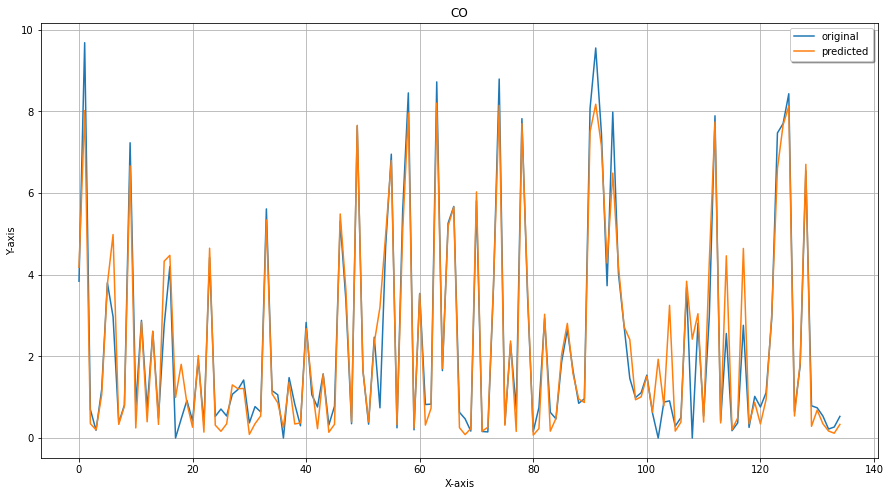

In [33]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_3_shift', 'humidity']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



In [96]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,2))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,2)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
#pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')



Polynomial linear regression MAE: 0.3088146604448187
Polynomial linear regression MSE: 0.29427869854584515
Polynomial linear regression RMSE: 0.5424746063603763
Polynomial linear regression R-2 score: 0.956
Polynomial linear regression Spearman correlation: 0.898


Coefficients:  [0.35011213 1.09063674 0.46350424]
Intercept:  -49.18826889930128
R2  0.9534055627264855
MAE of simple linear regression of  0.35729219041077476
MSE of simple linear regression 0.30936167214835997
RMSE of simple linear regression 0.5562029055554816
Test data Pearson correlation Random Forest: 0.977
Test data Spearman correlation of simple linear regression: 0.91


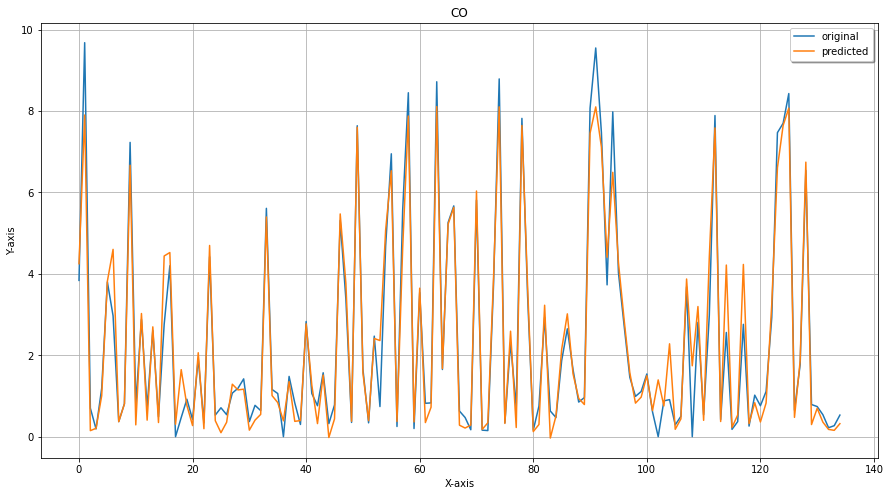

In [34]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_3_shift', 'temperature','humidity']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,3), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Polynomial linear regression MAE: 0.2509392521468817
Polynomial linear regression MSE: 0.1681573560768809
Polynomial linear regression RMSE: 0.41006994046977024
Polynomial linear regression R-2 score: 0.975
Polynomial linear regression Spearman correlation: 0.93


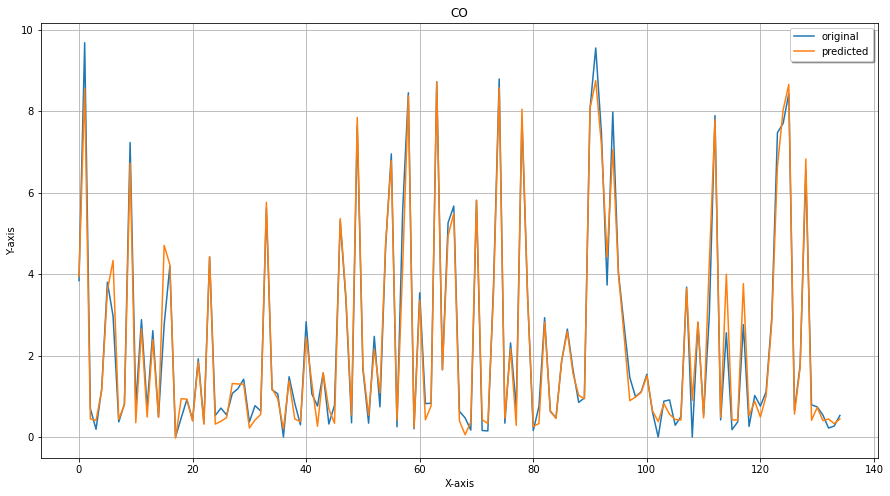

In [35]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,3))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,3)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
#pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, pred_y, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()


# CO_5

Coefficients:  [0.55354448]
Intercept:  -4.748337438687951
R2  0.9076585774755135
MAE of simple linear regression of  0.45599368606183127
MSE of simple linear regression 0.6130967246807281
RMSE of simple linear regression 0.7830049327307766
Test data Pearson correlation Random Forest: 0.953
Test data Spearman correlation of simple linear regression: 0.884


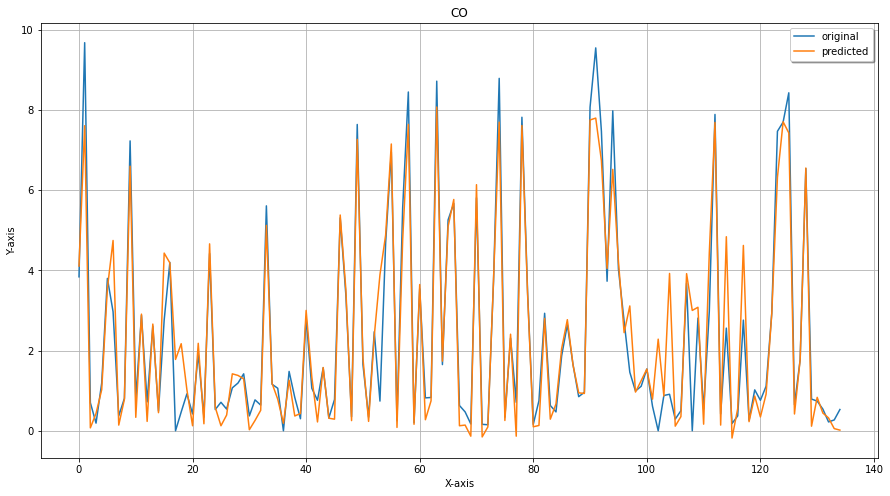

In [104]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2['Rolling_CO_5_shift']
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



In [105]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,1))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,1)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Polynomial linear regression Pearson correlation: {pearson[0]:.3}')


Polynomial linear regression MAE: 0.3912110074978438
Polynomial linear regression MSE: 0.46360717419372655
Polynomial linear regression RMSE: 0.6808870495124184
Polynomial linear regression R-2 score:  0.93
Polynomial linear regression Spearman correlation: 0.884
Polynomial linear regression Pearson correlation: 0.965


Coefficients:  [0.5657415  1.34882976]
Intercept:  -42.66057987604763
R2  0.8285473683453076
MAE of simple linear regression of  0.48526744349841006
MSE of simple linear regression 1.1383520421456466
RMSE of simple linear regression 1.0669358191314258
Test data Pearson correlation Random Forest: 0.914
Test data Spearman correlation of simple linear regression: 0.871


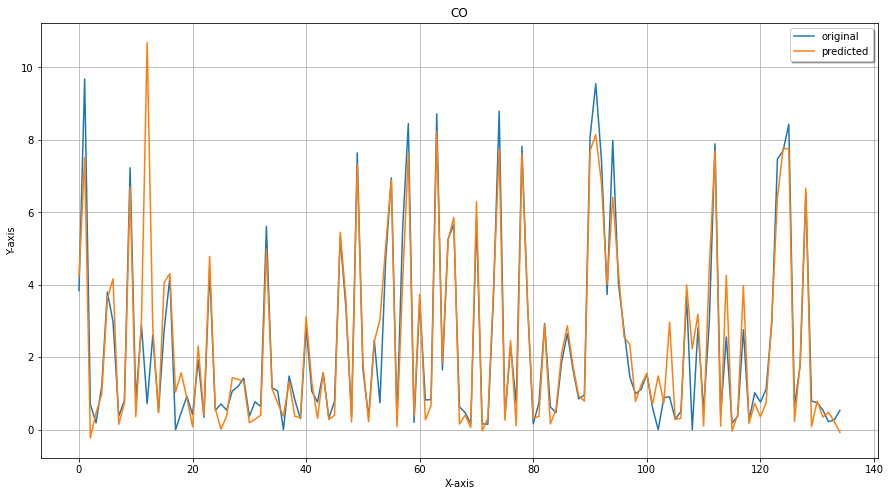

In [38]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_5_shift', 'temperature']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Polynomial linear regression MAE: 0.36109271879095717
Polynomial linear regression MSE: 1.14125950119099
Polynomial linear regression RMSE: 1.0682974778548295
Polynomial linear regression R-2 score: 0.828
Polynomial linear regression Spearman correlation: 0.919
Polynomial linear regression Pearson correlation: 0.918
Polynomial linear regression MAE: 0.36109271879095717
Polynomial linear regression MSE: 1.14125950119099
Polynomial linear regression RMSE: 1.0682974778548295
Polynomial linear regression R-2 score: 0.828
Polynomial linear regression Spearman correlation: 0.919


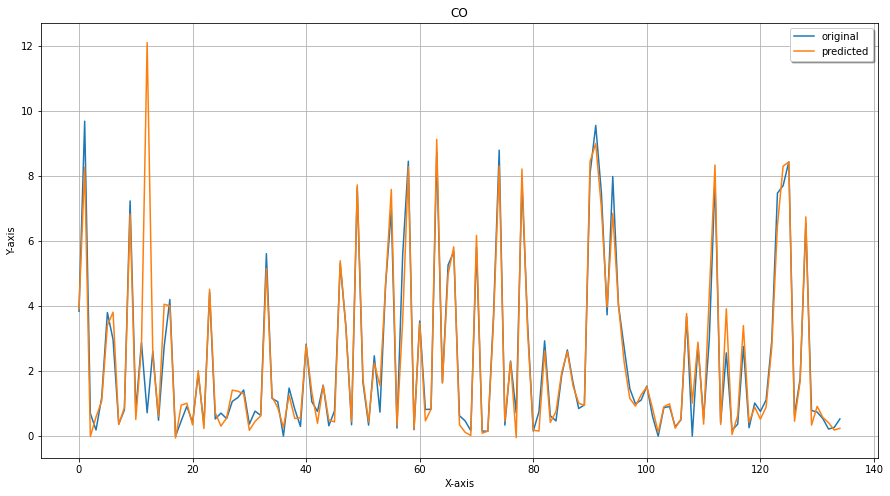

In [40]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,2))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,2)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Polynomial linear regression Pearson correlation: {pearson[0]:.3}')

from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,2))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,2)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
#pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
#print(f'Random Forest Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, pred_y, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()


Coefficients:  [0.5430213  0.10411696]
Intercept:  -8.260738477175737
R2  0.9073392961158157
MAE of simple linear regression of  0.45821955778599033
MSE of simple linear regression 0.6152165789187377
RMSE of simple linear regression 0.7843574305880819
Test data Pearson correlation Random Forest: 0.953
Test data Spearman correlation of simple linear regression: 0.886


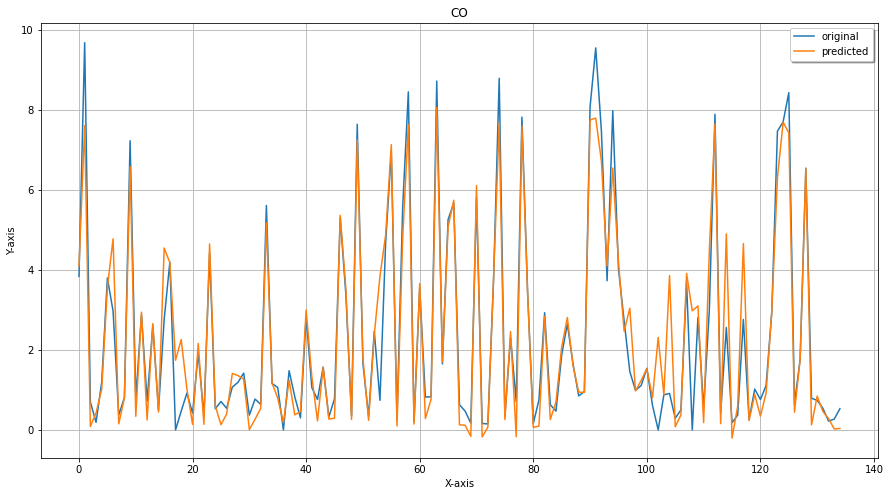

In [71]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_5_shift', 'humidity']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Coefficients:  [0.50075825 2.00906209 0.7044178 ]
Intercept:  -84.98425176678558
R2  0.8568663054230263
MAE of simple linear regression of  0.47933904246150744
MSE of simple linear regression 0.9503297321776039
RMSE of simple linear regression 0.9748485688442097
Test data Pearson correlation Random Forest: 0.927
Test data Spearman correlation of simple linear regression: 0.886


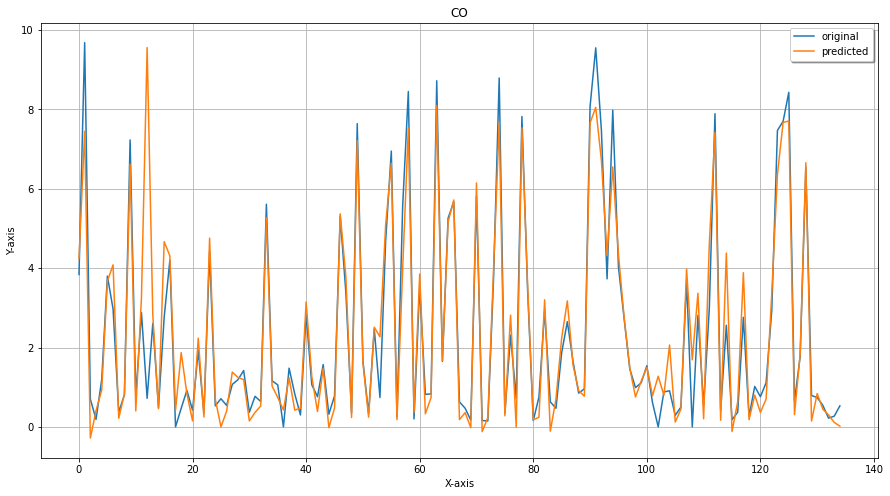

In [36]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_5_shift', 'temperature', 'humidity']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,3), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



# CO_8

Coefficients:  [0.42261081]
Intercept:  -3.5039860193110033
R2  0.9374096431858281
MAE of simple linear regression of  0.38902771579019263
MSE of simple linear regression 0.4155658610218091
RMSE of simple linear regression 0.6446439800555103
Test data Pearson correlation Random Forest: 0.968
Test data Spearman correlation of simple linear regression: 0.89


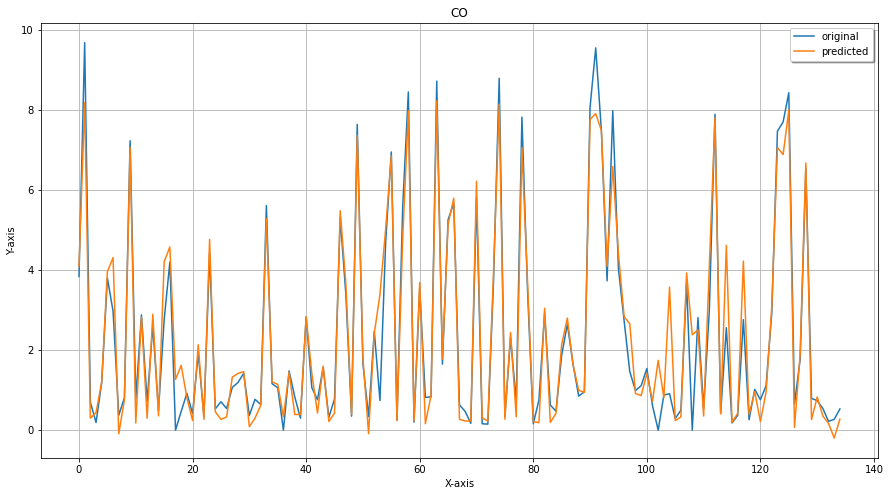

In [109]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2['Rolling_CO_8_shift']
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) 
# MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) 
#MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) 
#RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



In [110]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,1))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,1)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Polynomial linear regression Pearson correlation: {pearson[0]:.3}')



Polynomial linear regression MAE: 0.32706314551681065
Polynomial linear regression MSE: 0.3351487935036253
Polynomial linear regression RMSE: 0.5789203688795422
Polynomial linear regression R-2 score:  0.95
Polynomial linear regression Spearman correlation: 0.89
Polynomial linear regression Pearson correlation: 0.975


Coefficients:  [0.42693859 0.70103294]
Intercept:  -23.18660359121036
R2  0.9498584611406075
MAE of simple linear regression of  0.3790105566774875
MSE of simple linear regression 0.3329124937077202
RMSE of simple linear regression 0.576985696276537
Test data Pearson correlation Random Forest: 0.975
Test data Spearman correlation of simple linear regression: 0.887


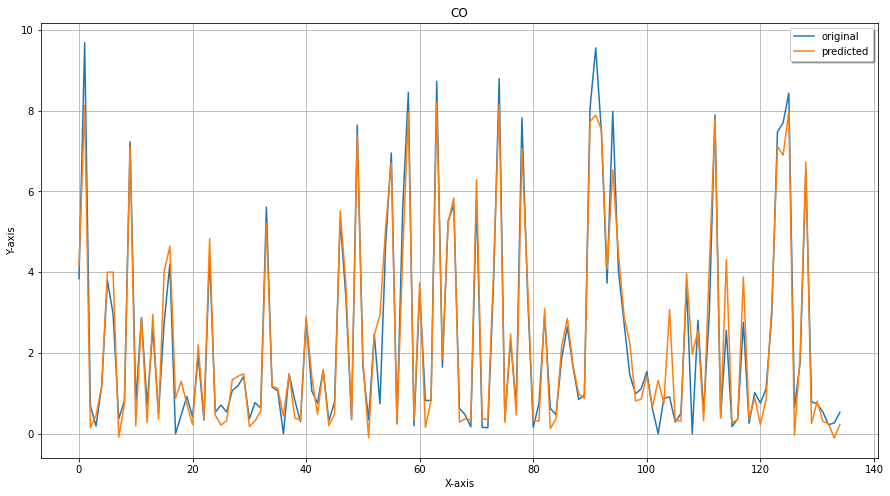

In [42]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_8_shift', 'temperature']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Polynomial linear regression MAE: 0.2513985197515902
Polynomial linear regression MSE: 0.14791653731551144
Polynomial linear regression RMSE: 0.38459919047693203
Polynomial linear regression R-2 score: 0.978
Polynomial linear regression Spearman correlation: 0.94
Polynomial linear regression Pearson correlation: 0.989


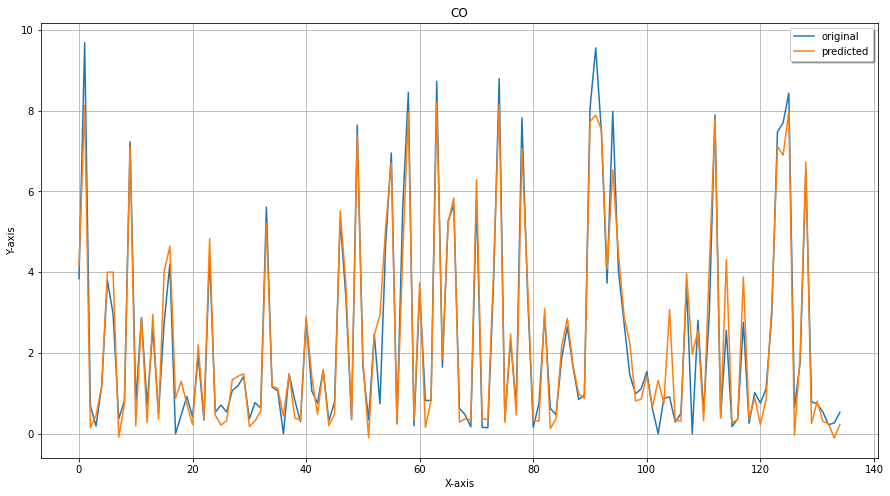

In [43]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,2))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,2)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Polynomial linear regression Pearson correlation: {pearson[0]:.3}')

x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Coefficients:  [0.40064836 0.29094428]
Intercept:  -13.391784739057474
R2  0.9353706776200771
MAE of simple linear regression of  0.39737060398059
MSE of simple linear regression 0.42910348125683645
RMSE of simple linear regression 0.6550599066168197
Test data Pearson correlation Random Forest: 0.967
Test data Spearman correlation of simple linear regression: 0.897


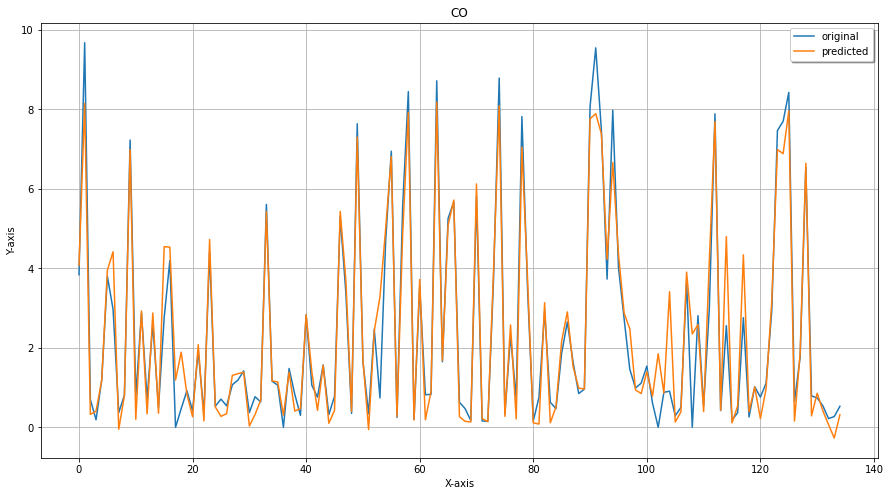

In [75]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_8_shift', 'humidity']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,2), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,2))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Coefficients:  [0.37509191 1.48897257 0.75127041]
Intercept:  -70.84133772421583
R2  0.9534500156793919
MAE of simple linear regression of  0.3854432086051548
MSE of simple linear regression 0.30906652876542023
RMSE of simple linear regression 0.5559375223578817
Test data Pearson correlation Random Forest: 0.977
Test data Spearman correlation of simple linear regression: 0.91


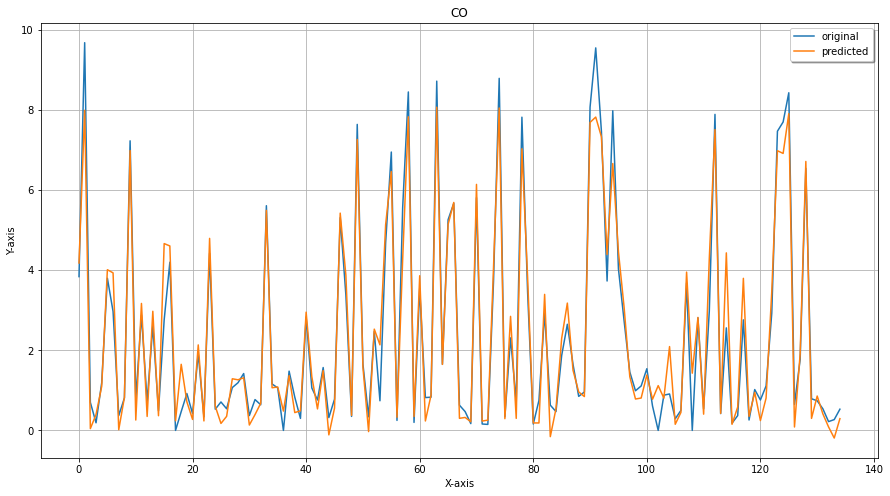

In [44]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O2[['Rolling_CO_8_shift', 'temperature', 'humidity']]
y = O2['CO(ppm)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,3), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,3))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,3), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
#plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



# SO2

In [2]:
ref = pd.read_csv('HCU_SO2_data.csv')
s = pd.read_csv('SO2_HCU_deployment.csv', parse_dates = ['Timestamp'])


In [3]:
ref['SO2'] = ref['SO2'].apply(pd.to_numeric, errors='coerce')

In [4]:
ref = ref.drop(columns = {'From Date'})
ref['To Date'] = pd.to_datetime(ref['To Date'], dayfirst = True)
ref = ref.mask(ref.astype(object).eq('None')).dropna()
ref = ref.rename(columns = {'To Date': 'Timestamp'})
ref = ref.set_index('Timestamp')
ref = ref.resample('30T', label = 'right', closed = 'right').mean().round(3)

In [5]:
s = s.set_index('Timestamp')
s = s.resample('30T', label='right', closed='right').mean().round(3)

In [6]:
s

,Temperature,Humidity,SO2_1,SO2_2,SO2_3,SO2_4,SO2_5,SO2_6,SO2_7,SO2_8
Timestamp,,,,,,,,,,
2022-02-08 17:30:00,30.727,42.000,4.000,-46.000,33.000,-14.333,39.333,-35.667,11.333,0.667
2022-02-08 18:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-02-08 18:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-02-08 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-02-08 19:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-02-12 13:30:00,34.309,24.833,3.328,-37.060,28.975,-13.473,32.930,-24.239,10.905,-10.015
2022-02-12 14:00:00,34.153,24.583,18.031,-35.687,29.692,-13.692,33.651,-24.210,11.118,-10.108
2022-02-12 14:30:00,34.922,23.788,15.595,-38.971,32.088,-14.556,35.932,-25.859,11.424,-11.024


In [7]:
O = ref.merge(s, on = 'Timestamp', how = 'inner').

In [8]:


O = O.dropna()

In [9]:
print(O.head())
list(O)
print(len(O))
O.dtypes
#O = O.apply(pd.to_numeric, errors='coerce')

                      SO2  Temperature  Humidity   SO2_1   SO2_2   SO2_3  \
Timestamp                                                                  
2022-02-09 15:00:00  3.35       30.047    45.343   9.196 -41.304  31.109   
2022-02-09 22:30:00  3.60       28.370    51.333   7.819 -29.095  25.422   
2022-02-10 04:00:00  3.00       26.176    50.820   1.873 -21.794  20.206   
2022-02-10 18:00:00  3.90       33.122    34.293  16.590 -41.244  37.210   
2022-02-11 12:00:00  6.15       31.944    38.624   5.312 -32.203  26.490   

                      SO2_4   SO2_5   SO2_6   SO2_7   SO2_8  
Timestamp                                                    
2022-02-09 15:00:00 -15.957  37.717 -28.533   9.283 -44.054  
2022-02-09 22:30:00 -13.397  27.950 -23.050  11.151 -12.276  
2022-02-10 04:00:00 -10.201  21.495 -18.020   8.961  -8.990  
2022-02-10 18:00:00 -15.756  38.532 -29.971  13.337 -12.615  
2022-02-11 12:00:00 -11.728  29.703 -22.292  10.119  -9.550  
58


SO2            float64
Temperature    float64
Humidity       float64
SO2_1          float64
SO2_2          float64
SO2_3          float64
SO2_4          float64
SO2_5          float64
SO2_6          float64
SO2_7          float64
SO2_8          float64
dtype: object

In [10]:
O['Timestamp'] = pd.to_datetime(O.index, yearfirst = True)
#O['SO2'] = O['SO2'].apply(pd.to_numeric, errors='coerce')
O.dtypes

SO2                   float64
Temperature           float64
Humidity              float64
SO2_1                 float64
SO2_2                 float64
SO2_3                 float64
SO2_4                 float64
SO2_5                 float64
SO2_6                 float64
SO2_7                 float64
SO2_8                 float64
Timestamp      datetime64[ns]
dtype: object

In [11]:
fig = px.line(O, x='Timestamp', y=O.columns)
fig.show()



Text(0.5, 1.0, 'correlation of data')

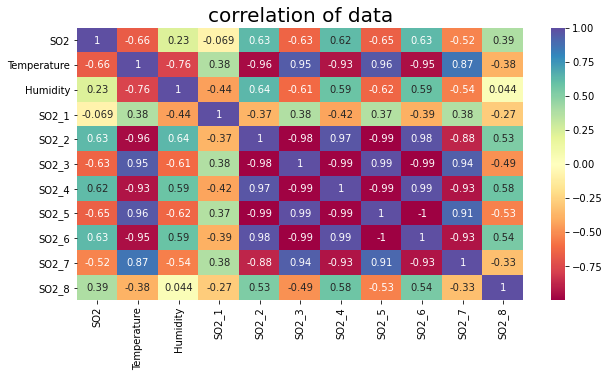

In [12]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(O[['SO2',
 'Temperature',
 'Humidity',
 'SO2_1',
 'SO2_2',
 'SO2_3',
 'SO2_4',
 'SO2_5',
 'SO2_6',
 'SO2_7',
 'SO2_8']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

*************SO2_1***************
max correlation is at lag 17
max correlation is  0.448
Pearsons correlation: -0.069
MSE :  323.9049868103448
MAE :  12.933155172413795
RMSE :  17.997360551212637
*************SO2_2***************
max correlation is at lag 0
max correlation is  0.621
Pearsons correlation: 0.632
MSE :  2157.9096641724136
MAE :  45.33458620689655
RMSE :  46.45330627815865
*************SO2_3***************
max correlation is at lag -28
max correlation is  0.567
Pearsons correlation: -0.632
MSE :  453.2532172931035
MAE :  19.559327586206898
RMSE :  21.289744415870835
*************SO2_4***************
max correlation is at lag 0
max correlation is  0.611
Pearsons correlation: 0.622
MSE :  862.7476167758621
MAE :  27.035327586206893
RMSE :  29.372565716597897
*************SO2_5***************
max correlation is at lag -29
max correlation is  0.557
Pearsons correlation: -0.646
MSE :  553.3383265172414
MAE :  21.46993103448276
RMSE :  23.523144486170242
*************SO2_6******

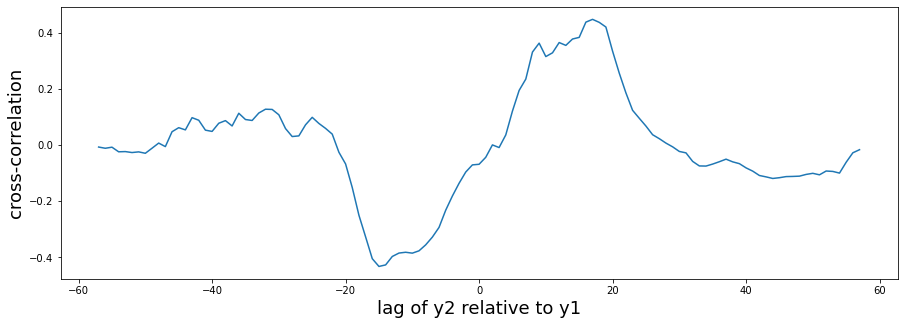

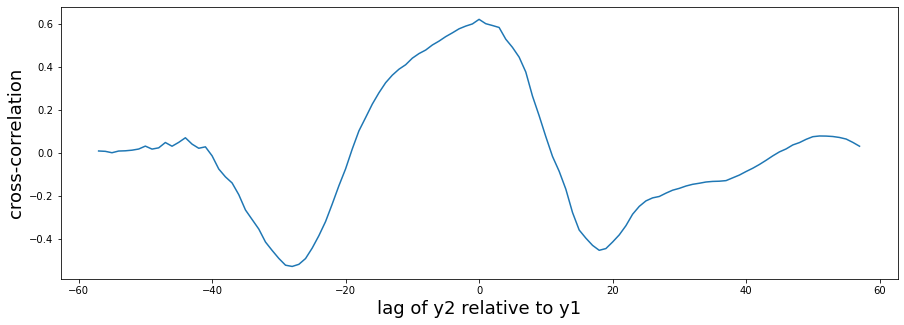

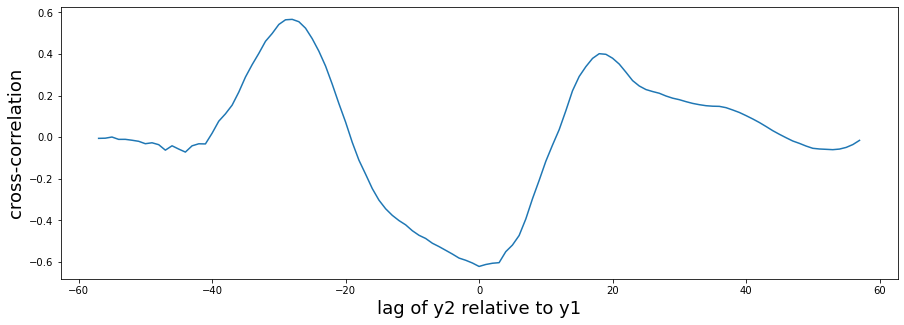

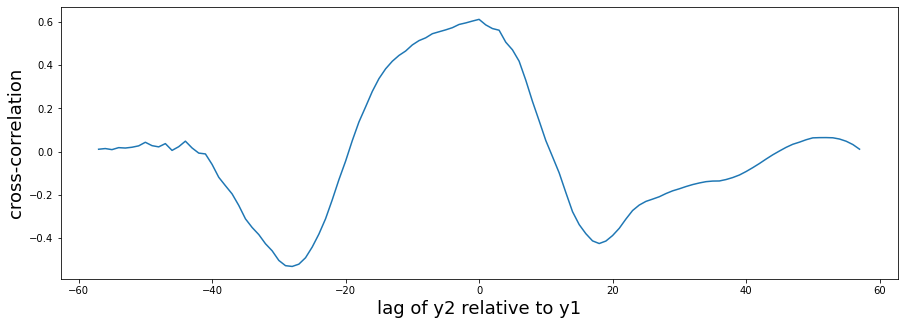

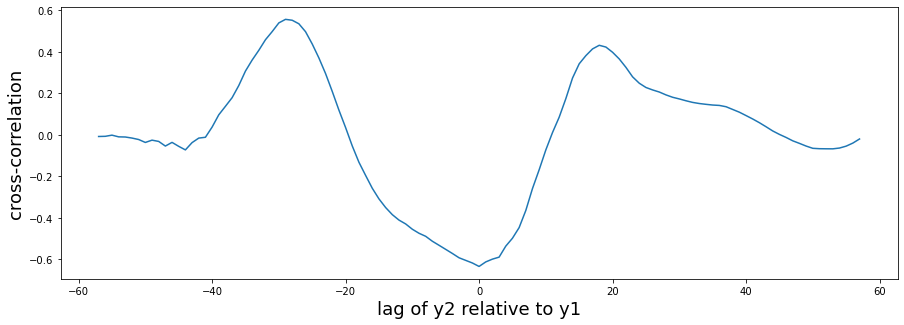

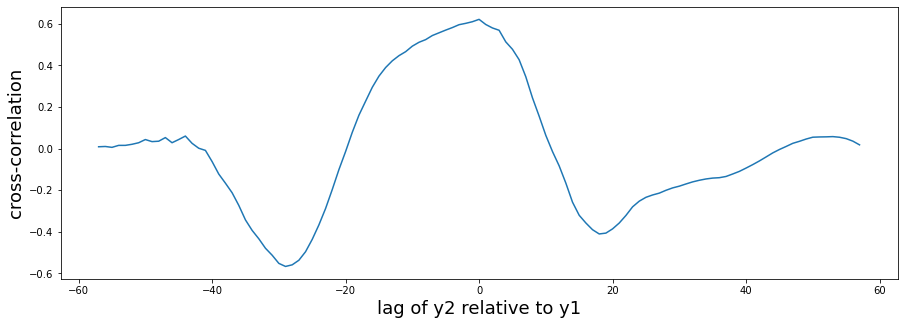

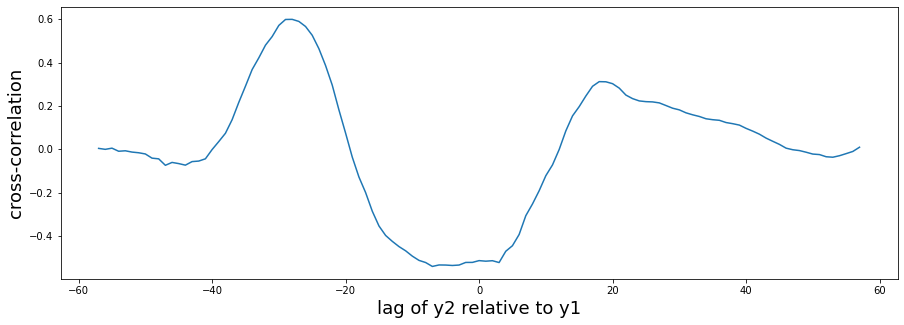

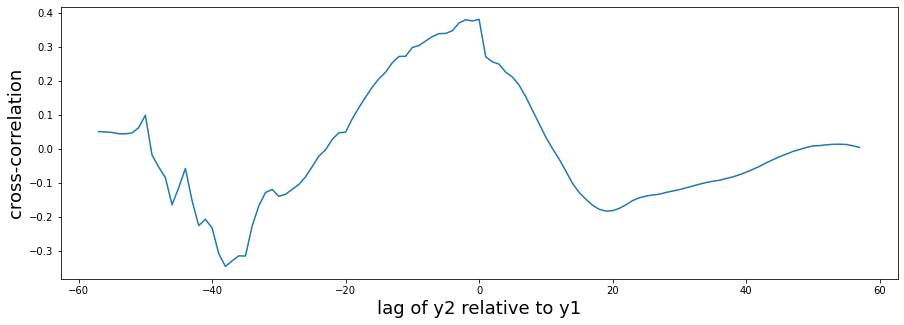

In [15]:
O = O.dropna()
y = O['SO2']
y1 = O['SO2_1']
y2 = O['SO2_2']
y3 = O['SO2_3']
y4 = O['SO2_4']
y5 = O['SO2_5']
y6 = O['SO2_6']
y7 = O['SO2_7']
y8 = O['SO2_8']

print('*************SO2_1***************')
lag_correlation(y, y1)
print('*************SO2_2***************')
lag_correlation(y, y2)
print('*************SO2_3***************')
lag_correlation(y, y3)
print('*************SO2_4***************')
lag_correlation(y, y4)
print('*************SO2_5***************')
lag_correlation(y, y5)
print('*************SO2_6***************')
lag_correlation(y, y6)
print('*************SO2_7***************')
lag_correlation(y, y7)
print('*************SO2_8***************')
lag_correlation(y, y8)


# HCU

In [31]:
a = pd.read_csv('HCU_CO&SO2_25mar.csv')
b1 = pd.read_csv('HCUv2_SO2_25mar.csv', parse_dates = ['Timestamp'])



In [44]:
a.dtypes

From Date    object
To Date      object
SO2          object
CO           object
Temp         object
RH           object
dtype: object

In [48]:
b2 = pd.read_csv('HCU_deployment - Sheet2.csv', parse_dates = ['Timestamp'])

In [49]:
b2['Timestamp'] = pd.to_datetime(b2['Timestamp'], yearfirst = True)

In [50]:
b2['CO_1'] = b2['CO_1'].apply(pd.to_numeric, errors='coerce')
b2['CO_2'] = b2['CO_2'].apply(pd.to_numeric, errors='coerce')
b2['CO_3'] = b2['CO_3'].apply(pd.to_numeric, errors='coerce')
b2['CO_4'] = b2['CO_4'].apply(pd.to_numeric, errors='coerce')
b2['CO_5'] = b2['CO_5'].apply(pd.to_numeric, errors='coerce')
b2['CO_6'] = b2['CO_6'].apply(pd.to_numeric, errors='coerce')
b2['CO_7'] = b2['CO_7'].apply(pd.to_numeric, errors='coerce')
b2['CO_8'] = b2['CO_8'].apply(pd.to_numeric, errors='coerce')

In [33]:
b1.set_index("Timestamp", inplace = True)
b1 = b1.resample('15T', label='right', closed='right').mean().round(3)
#b2.set_index("Timestamp", inplace = True)
#b2 = b2.resample('15T', label='right', closed='right').mean().round(3)

In [32]:
a['SO2'] = a['SO2'].apply(pd.to_numeric, errors='coerce')
a['Temp'] = a['Temp'].apply(pd.to_numeric, errors = 'coerce')
a['RH'] = a['RH'].apply(pd.to_numeric, errors = 'coerce')
a = a.drop(columns = {'To Date'})
a['From Date'] = pd.to_datetime(a['From Date'], dayfirst = True)
a = a.mask(a.astype(object).eq('None')).dropna()
a = a.rename(columns = {'From Date': 'Timestamp'})
a = a.set_index('Timestamp')
a = a.resample('30T', label = 'right', closed = 'right').mean().round(3)


In [4]:
a['CO'] = a['CO'].apply(pd.to_numeric, errors='coerce')
a = a.drop(columns = {'From Date'})
a['To Date'] = pd.to_datetime(a['To Date'], dayfirst = True)
a = a.mask(a.astype(object).eq('None')).dropna()
a = a.rename(columns = {'To Date': 'Timestamp'})
a = a.set_index('Timestamp')
a = a.resample('30T', label = 'right', closed = 'right').mean().round(3)


KeyError: "['From Date'] not found in axis"

In [34]:
a

,PM2.5,PM10,NO2,SO2,CO,Ozone,Temp,RH,WS
Timestamp,,,,,,,,,
2022-03-03 12:30:00,18.0,98.0,32.60,4.75,0.420,26.65,27.90,36.0,2.85
2022-03-03 13:00:00,27.0,76.0,33.05,5.10,0.425,30.20,27.50,35.5,2.90
2022-03-03 13:30:00,27.0,76.0,31.65,5.35,0.330,28.10,27.55,34.5,2.65
2022-03-03 14:00:00,28.0,59.0,29.45,4.75,0.355,25.70,27.85,34.5,2.70
2022-03-03 14:30:00,28.0,59.0,25.25,4.80,0.325,31.75,28.05,34.0,2.45
...,...,...,...,...,...,...,...,...,...
2022-03-25 03:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-03-25 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-03-25 04:30:00,49.0,107.0,36.60,2.60,0.390,88.20,28.00,79.0,0.30


In [18]:
O1 = a.merge(b2, on = 'Timestamp', how = 'inner')

In [35]:
O = a.merge(b1, on = 'Timestamp', how = 'inner')

In [14]:
list(O)

['PM2.5',
 'PM10',
 'NO2',
 'SO2',
 'CO',
 'Ozone',
 'Temp',
 'RH',
 'WS',
 'temperature',
 'humidity',
 'SO_1',
 'SO_2',
 'SO_3',
 'SO_4',
 'SO_5',
 'SO_6',
 'SO_7',
 'SO_8']

In [36]:
O = O.dropna()

Text(0.5, 1.0, 'correlation of data')

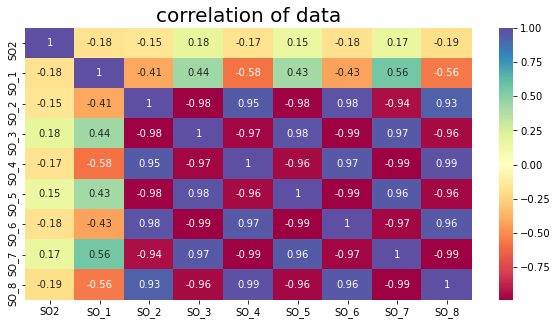

In [37]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(O[[
 'SO2',
 'SO_1',
 'SO_2',
 'SO_3',
 'SO_4',
 'SO_5',
 'SO_6',
 'SO_7',
 'SO_8']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

In [38]:
fig = px.line(O, x=O.index, y=O.columns)
fig.show()



Text(0.5, 1.0, 'correlation of data')

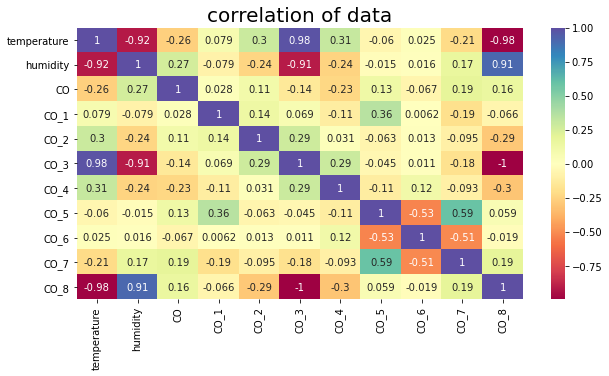

In [11]:
plt.rcParams['figure.figsize'] = (10, 5)
hm = sns.heatmap(O1[['temperature',
 'humidity','CO',
 'CO_1',
 'CO_2',
 'CO_3',
 'CO_4',
 'CO_5',
 'CO_6',
 'CO_7',
 'CO_8']].corr(), annot = True, cmap = 'Spectral')
hm.set_title(label = "correlation of data", fontsize = 20)

In [19]:
O1.reset_index

<bound method DataFrame.reset_index of                         CO  temperature  humidity   CO_1   CO_2   CO_3   CO_4  \
Timestamp                                                                       
2022-03-03 12:00:00  0.380          NaN       NaN    NaN    NaN    NaN    NaN   
2022-03-03 12:30:00  0.410          NaN       NaN    NaN    NaN    NaN    NaN   
2022-03-03 13:00:00  0.430          NaN       NaN    NaN    NaN    NaN    NaN   
2022-03-03 13:30:00  0.375          NaN       NaN    NaN    NaN    NaN    NaN   
2022-03-03 14:00:00  0.330          NaN       NaN    NaN    NaN    NaN    NaN   
...                    ...          ...       ...    ...    ...    ...    ...   
2022-03-08 08:30:00  0.480       26.282    38.241 -0.067  1.000  6.056 -4.506   
2022-03-08 09:00:00  0.440       27.348    36.303  0.267  0.867  6.367 -4.833   
2022-03-08 09:30:00  0.430       28.473    34.465  0.250  1.182  6.875 -4.125   
2022-03-08 10:00:00    NaN       29.726    33.921  0.159  1.068  7.545

In [21]:
fig = px.line(O1, x=O1.index, y=O1.columns)
fig.show()



max correlation is at lag 58
max correlation is  0.37
Pearsons correlation: -0.173
MSE :  272.5609832410714
MAE :  13.245214285714285
RMSE :  16.50942104499947
max correlation is at lag 74
max correlation is  0.271
Pearsons correlation: -0.202
MSE :  2224.9834979910715
MAE :  44.14344642857144
RMSE :  47.169730739013886
max correlation is at lag 0
max correlation is  0.301
Pearsons correlation: 0.302
MSE :  473.59249791517857
MAE :  20.085620535714288
RMSE :  21.76218044946734
max correlation is at lag -53
max correlation is  0.343
Pearsons correlation: -0.188
MSE :  730.9330829553572
MAE :  25.46345535714286
RMSE :  27.03577413271825
max correlation is at lag -5
max correlation is  0.302
Pearsons correlation: 0.200
MSE :  881.7285142723214
MAE :  27.057727678571432
RMSE :  29.693913758080484
max correlation is at lag -53
max correlation is  0.289
Pearsons correlation: -0.216
MSE :  641.1922314419643
MAE :  24.35729017857143
RMSE :  25.321773860493348
max correlation is at lag 57
max c

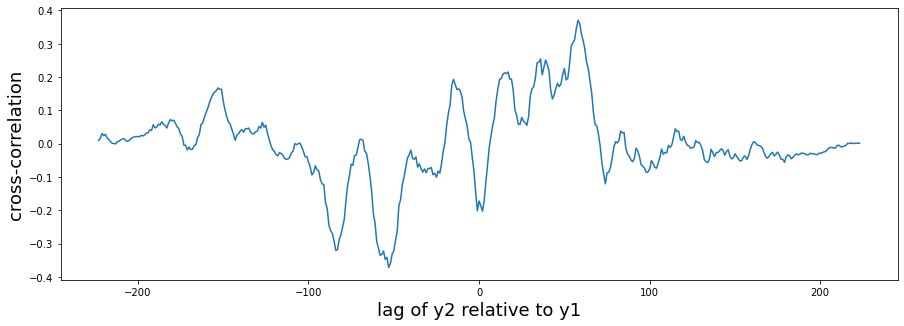

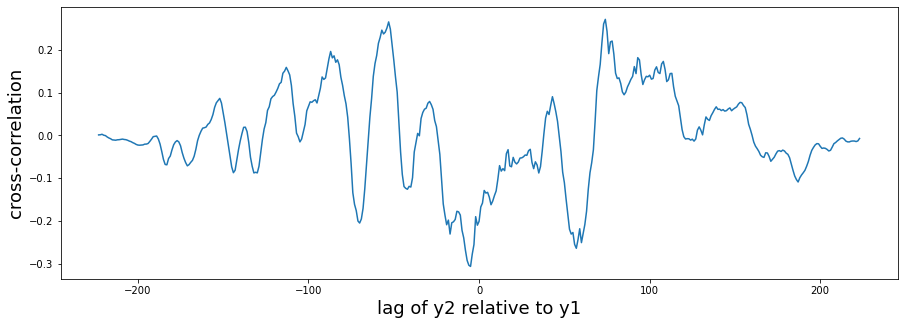

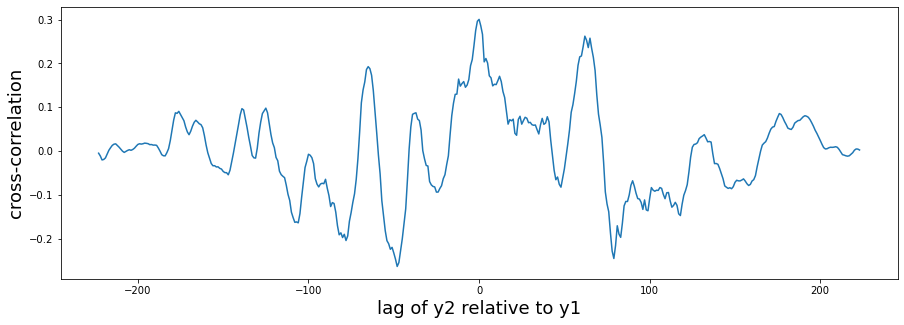

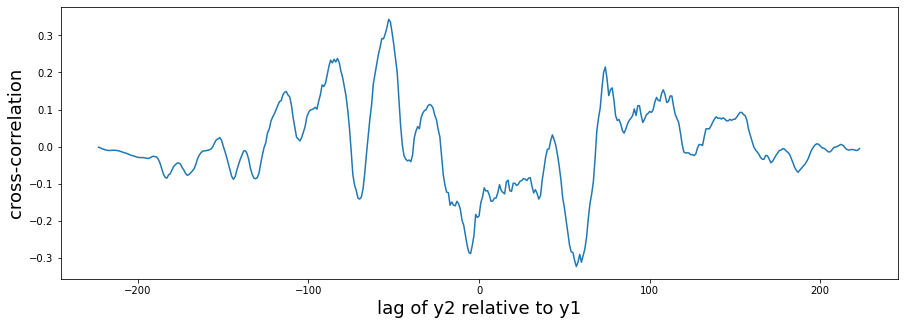

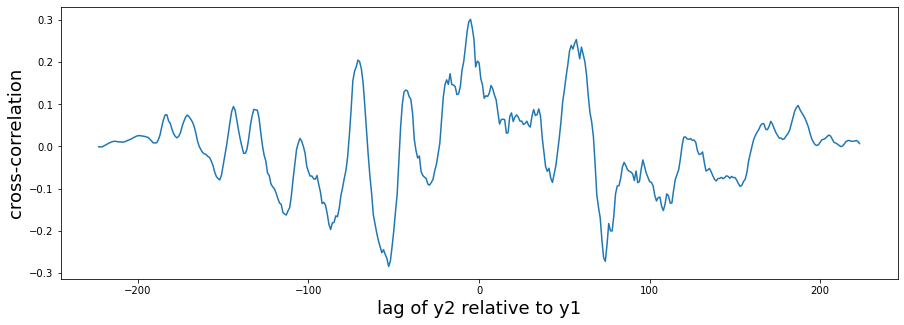

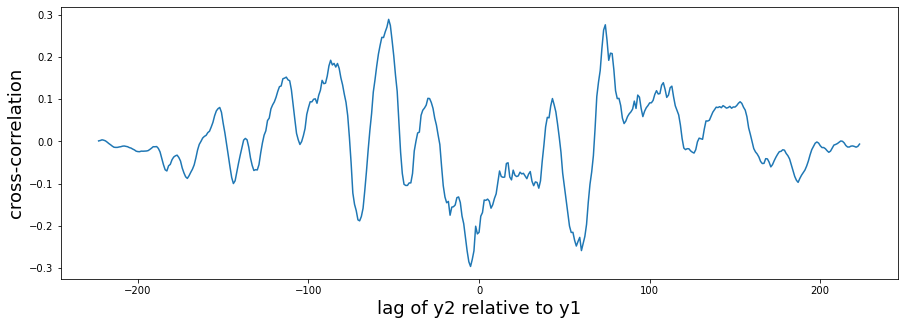

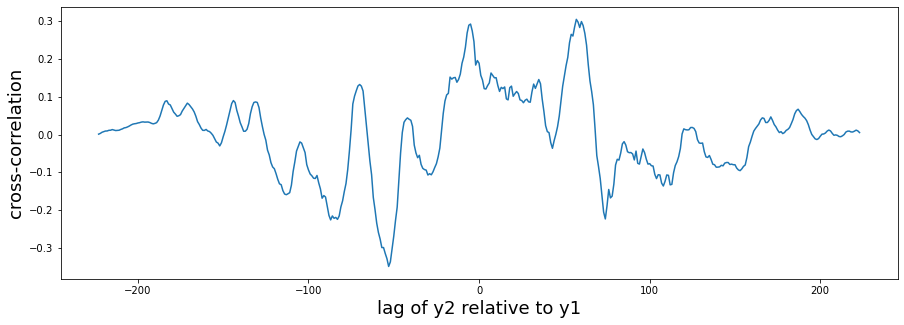

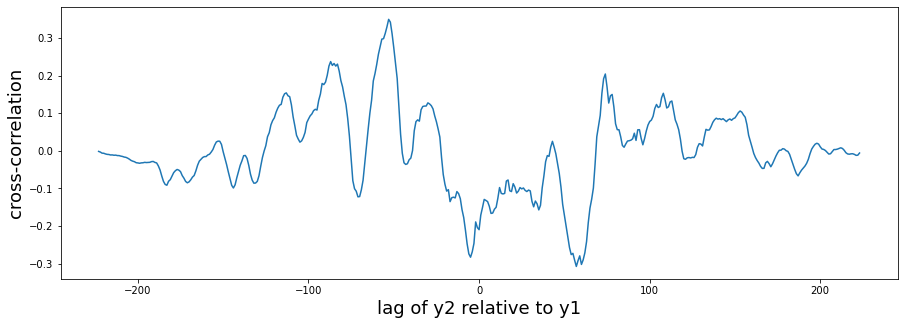

In [116]:
O1 = O.dropna()
y1 = O1['SO2']
y2 = O1['SO_1']
y3 = O1['SO_2']
y4 = O1['SO_3_shift']
y5 = O1['SO_4']
y6 = O1['SO_5']
y7 = O1['SO_6']
y8 = O1['SO_7']
y9 = O1['SO_8']



lag_correlation(y1, y2)
lag_correlation(y1, y3)
lag_correlation(y1, y4)
lag_correlation(y1, y5)
lag_correlation(y1, y6)
lag_correlation(y1, y7)
lag_correlation(y1, y8)
lag_correlation(y1, y9)


In [114]:
O['SO_3_shift']= O['SO_3'].shift(5)

Coefficients:  [0.08612835]
Intercept:  3.3277536753250367
R2  -0.048965141373412235
MAE of simple linear regression of  1.5910016344220983
MSE of simple linear regression 3.8013524661168567
RMSE of simple linear regression 1.949705738340239
Test data Pearson correlation Random Forest: 0.183
Test data Spearman correlation of simple linear regression: 0.19


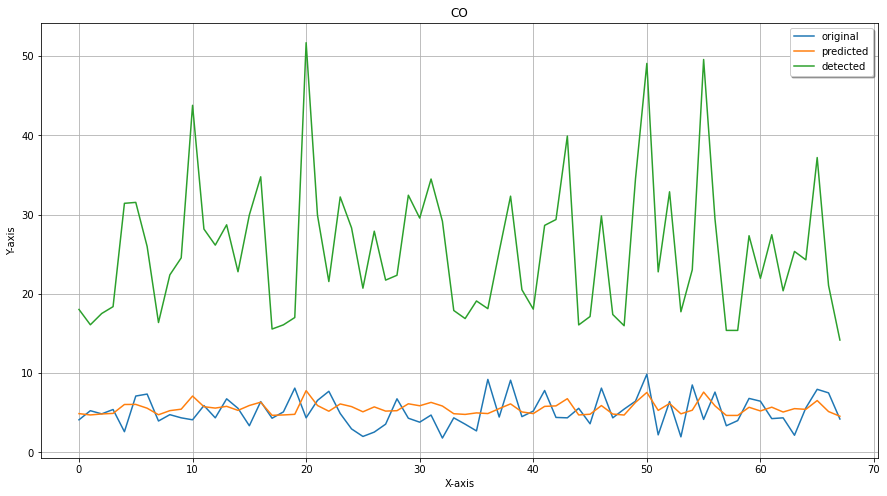

In [119]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
from scipy.stats import spearmanr, pearsonr
X = O1['SO_3_shift']
y = O1['SO2']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0)
regressor = LinearRegression()
regressor.fit(X_train.values.reshape(-1,1), y_train)
print ('Coefficients: ', regressor.coef_)
print ('Intercept: ',regressor.intercept_)
test_y_hat = regressor.predict(X_test.values.reshape(-1,1))
ssr = np.sum((test_y_hat - y_test)**2)
ssr # total sum of squares
sst = np.sum((y_test - np.mean(y_test))**2)
sst # R2 score
r2 = 1 - (ssr/sst)
print("R2 ", r2) # MAE
print("MAE of simple linear regression of ", metrics.mean_absolute_error(y_test,test_y_hat)) #MSE
print("MSE of simple linear regression", mean_squared_error(y_test, test_y_hat)) #RMSE
print("RMSE of simple linear regression", np.sqrt(mean_squared_error(y_test, test_y_hat)))
spearman = spearmanr(y_test, test_y_hat)
spearman1 = spearmanr(X_train.values.reshape(-1,1), y_train)
pearson = pearsonr(y_test, test_y_hat)
print(f'Test data Pearson correlation Random Forest: {pearson[0]:.3}')
print(f'Test data Spearman correlation of simple linear regression: {spearman[0]:.3}')
#print(f'Train data Spearman correlation of simple linear regression: {spearman1[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, test_y_hat, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()



Polynomial linear regression MAE: 1.6042641134338242
Polynomial linear regression MSE: 3.8639719169833238
Polynomial linear regression RMSE: 1.9656988367965536
Polynomial linear regression R-2 score: -0.0662
Polynomial linear regression Spearman correlation: 0.172
Polynomial linear regression Pearson correlation: 0.181


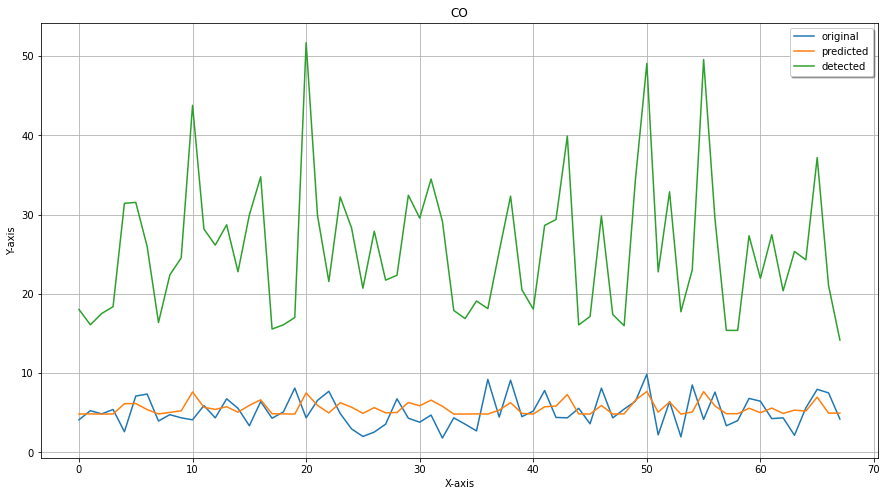

In [120]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=3)
X_poly = poly_reg.fit_transform(X_train.values.reshape(-1,1))
pol_reg = LinearRegression()
pol_reg.fit(X_poly, y_train)

#predicting

pred_y = pol_reg.predict(poly_reg.fit_transform(X_test.values.reshape(-1,1)))

print('Polynomial linear regression MAE:', metrics.mean_absolute_error(y_test, pred_y))
print('Polynomial linear regression MSE:', metrics.mean_squared_error(y_test, pred_y))
print('Polynomial linear regression RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_y)))



test_score = r2_score(y_test, pred_y)
spearman = spearmanr(y_test, pred_y)
pearson = pearsonr(y_test, pred_y)

print(f'Polynomial linear regression R-2 score: {test_score:>5.3}')
print(f'Polynomial linear regression Spearman correlation: {spearman[0]:.3}')
print(f'Polynomial linear regression Pearson correlation: {pearson[0]:.3}')
x_ax = range(len(y_test))
plt.figure(figsize = (15, 8))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax,pred_y, label="predicted")
plt.plot(x_ax, X_test, label="detected")
plt.title("CO")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [110]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

r2 = []
mae = []
mse = []
rmse= []
pear = []
spear= []
n = list(range(1, 101))
for i in n:
    regr = RandomForestRegressor(max_depth=i, random_state=0)
    regr.fit(X_train.values.reshape(-1,1), y_train)
    test_y_hat = regr.predict(X_test.values.reshape(-1,1))
    R2_score = r2_score(y_test,test_y_hat).round(3)
    MAE = metrics.mean_absolute_error(y_test,test_y_hat).round(3)
    MSE = mean_squared_error(y_test, test_y_hat).round(3)
    RMSE = np.sqrt(mean_squared_error(y_test, test_y_hat)).round(3)
    PEAR = pearsonr(y_test, test_y_hat)
    SPEAR = spearman = spearmanr(y_test, test_y_hat)
    r2.append(R2_score)
    mae.append(MAE)
    mse.append(MSE)
    rmse.append(RMSE)
    pear.append(PEAR[0].round(3))
    spear.append(SPEAR[0].round(3))
    
fig = make_subplots(rows=2, cols=3,
shared_xaxes=False,
vertical_spacing=0.05)

fig.add_trace(go.Scatter(x = n, y=r2, name = 'R2_score', xaxis="x1",yaxis = 'y1'),
row=1, col=1)
fig.add_trace(go.Scatter(x = n, y=mae, name = 'MAE', xaxis="x2",yaxis = 'y2'),
row=1, col=2)
fig.add_trace(go.Scatter(x = n, y=mse, name = 'MSE', xaxis="x3",yaxis = 'y3'),
row=1, col=3)
fig.add_trace(go.Scatter(x = n, y=rmse, name = 'RMSE', xaxis="x4",yaxis = 'y4'),
row=2, col=1)
fig.add_trace(go.Scatter(x = n, y=pear, name = 'Pearson correlation', xaxis="x5",yaxis = 'y5'),
row=2, col=2)
fig.add_trace(go.Scatter(x = n, y=spear, name = 'Spearman Corelation', xaxis="x6",yaxis = 'y6'),
row=2, col=3)




fig.update_layout(height=600, width=1000,
title_text="Random forest SO2")





# Create axis objects
fig.update_layout(   
xaxis1=dict(title ="n_estimators"),
yaxis1 =dict(title="R2 score"),
xaxis2=dict(title ="n_estimators"),
yaxis2 =dict(title="MAE"),
xaxis3=dict(title ="n_estimators"),
yaxis3 =dict(title="MSE"),
xaxis4=dict(title ="n_estimators"),
yaxis4 =dict(title="RMSE"),
xaxis5=dict(title ="n_estimators"),
yaxis5 =dict(title="Pearson correlation"),
xaxis6=dict(title ="n_estimators"),
yaxis6 =dict(title="Spearman Correaltion"),
)

fig.show()
#fig.write_html("November_1Hour_pm10.html")    


In [111]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
#X = dl1[['co_shift']]
#y = dl1[' CO(ppm)']
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, shuffle= True,random_state= 0)

regr = RandomForestRegressor(max_depth=1, random_state=0)
regr.fit(X_train.values.reshape(-1,1), y_train)
test_y_hat = regr.predict(X_test.values.reshape(-1,1))

print('R2_score: ', r2_score(y_test,test_y_hat))

print("MAE of simple Random Forestregression of ", metrics.mean_absolute_error(y_test,test_y_hat))

    #MSE
print("MSE of simple Random Forestregression", mean_squared_error(y_test, test_y_hat))

    #RMSE
print("RMSE of simple Random Forestregression", np.sqrt(mean_squared_error(y_test, test_y_hat)))

spearman = spearmanr(y_test, test_y_hat)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, test_y_hat)

print(f'Test data Spearman correlation of simple Random Forestregression: {spearman[0]:.3}')
print(f'Test data Pearson correlation simple Random Forestregression: {pearson[0]:.3}')

R2_score:  0.0926828222186944
MAE of simple Random Forestregression of  1.565250234808381
MSE of simple Random Forestregression 3.616205897440908
RMSE of simple Random Forestregression 1.9016324296353668
Test data Spearman correlation of simple Random Forestregression: 0.384
Test data Pearson correlation simple Random Forestregression: 0.306


In [105]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state = 0) 
  
# fit the regressor with X and Y data
regressor.fit(X_train.values.reshape(-1,1), y_train)
y_pred = regressor.predict(X_test.values.reshape(-1,1))
print('R2_score: ', r2_score(y_test,y_pred))

print("MAE of Decision tree regression of ", metrics.mean_absolute_error(y_test,y_pred))

    #MSE
print("MSE of Decision tree regression", mean_squared_error(y_test, y_pred))

    #RMSE
print("RMSE of Decision tree regression", np.sqrt(mean_squared_error(y_test, y_pred)))

spearman = spearmanr(y_test, y_pred)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, y_pred)

print(f'Test data Spearman correlation of Decision tree regression: {spearman[0]:.3}')
print(f'Test data Pearson correlation Decision tree regression: {pearson[0]:.3}')

R2_score:  -1.0660322769598936
MAE of Decision tree regression of  2.1079710144927537
MSE of Decision tree regression 8.234384057971015
RMSE of Decision tree regression 2.869561649097474
Test data Spearman correlation of Decision tree regression: 0.121
Test data Pearson correlation Decision tree regression: 0.09


In [112]:
from sklearn.svm import SVR

# Fit regression model
svr_rbf = SVR(kernel="rbf", C=100, gamma=0.055, epsilon=0.1)
svr_lin = SVR(kernel="linear", C=100, gamma=0.1)
svr_poly = SVR(kernel="poly", C=100, gamma="auto", degree=3, epsilon=0.1, coef0=1)

In [113]:
# SVR RBF (Radial basis function) kernel
svr_rbf.fit(X_train.values.reshape(-1,1), y_train)
y_pred1 = svr_rbf.predict(X_test.values.reshape(-1,1))
print('R2_score: ', r2_score(y_test,y_pred1))

print("MAE of SVR RBF kernel: ", metrics.mean_absolute_error(y_test,y_pred1))

    #MSE
print("MSE of SVR RBF kernel:", mean_squared_error(y_test, y_pred1))

    #RMSE
print("RMSE of SVR RBF kernel:", np.sqrt(mean_squared_error(y_test, y_pred1)))

spearman = spearmanr(y_test, y_pred1)
#spearman1 = spearmanr(X_train.values.reshape(-1,2), y_train)
pearson = pearsonr(y_test, y_pred1)

print(f'Test data Spearman correlation of SVR RBF kernel: {spearman[0]:.3}')
print(f'Test data Pearson correlation SVR RBF kernel: {pearson[0]:.3}')

R2_score:  0.08279570855378304
MAE of SVR RBF kernel:  1.4167409082568523
MSE of SVR RBF kernel: 3.655612005491404
RMSE of SVR RBF kernel: 1.9119654822960073
Test data Spearman correlation of SVR RBF kernel: 0.356
Test data Pearson correlation SVR RBF kernel: 0.34
